# 1. Read and display Data 

In [3]:
import pandas as pd
import os
from tqdm import tqdm
import math

# Define file paths and settings
input_csv = 'Amazon_Reviews.csv'
output_folder = 'Amazon_Reviews_csv_chunks'
chunk_size = 50000

# Step 1: Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Step 2: Get total number of rows to calculate number of chunks
print("Calculating total number of chunks...")
total_rows = sum(1 for _ in open(input_csv)) - 1  # subtract 1 for header
total_chunks = math.ceil(total_rows / chunk_size)
print(f"Total rows: {total_rows}, Chunk size: {chunk_size}, Total chunks: {total_chunks}")

# Step 3: Split the large CSV file into chunks with progress bar
print("\nSplitting CSV into chunks...")
for i, chunk in enumerate(tqdm(pd.read_csv(input_csv, chunksize=chunk_size), total=total_chunks, desc="Creating chunks")):
    chunk_filename = os.path.join(output_folder, f'chunk_{i+1}.csv')
    chunk.to_csv(chunk_filename, index=False)
    print(f'Saved: {chunk_filename}  [{i+1}/{total_chunks}]')
print("✅ All chunks created and saved to CSV file !!")

Calculating total number of chunks...
Total rows: 568454, Chunk size: 50000, Total chunks: 12

Splitting CSV into chunks...


Creating chunks:   8%|▊         | 1/12 [00:03<00:43,  3.96s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_1.csv  [1/12]


Creating chunks:  17%|█▋        | 2/12 [00:06<00:33,  3.34s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_2.csv  [2/12]


Creating chunks:  25%|██▌       | 3/12 [00:10<00:30,  3.38s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_3.csv  [3/12]


Creating chunks:  33%|███▎      | 4/12 [00:14<00:28,  3.59s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_4.csv  [4/12]


Creating chunks:  42%|████▏     | 5/12 [00:17<00:25,  3.64s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_5.csv  [5/12]


Creating chunks:  50%|█████     | 6/12 [00:21<00:21,  3.52s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_6.csv  [6/12]


Creating chunks:  58%|█████▊    | 7/12 [00:24<00:17,  3.48s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_7.csv  [7/12]


Creating chunks:  67%|██████▋   | 8/12 [00:27<00:13,  3.38s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_8.csv  [8/12]


Creating chunks:  75%|███████▌  | 9/12 [00:30<00:09,  3.30s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_9.csv  [9/12]


Creating chunks:  83%|████████▎ | 10/12 [00:34<00:06,  3.26s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_10.csv  [10/12]


Creating chunks:  92%|█████████▏| 11/12 [00:37<00:03,  3.21s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_11.csv  [11/12]


Creating chunks: 100%|██████████| 12/12 [00:38<00:00,  3.23s/it]

Saved: Amazon_Reviews_csv_chunks\chunk_12.csv  [12/12]
✅ All chunks created and saved to CSV file !!


In [4]:
# Step 4: Read chunk files with progress bar
print("\nReading chunks and combining them...")
chunk_files = sorted([f for f in os.listdir(output_folder) if f.endswith('.csv')])
all_chunks = []
for filename in tqdm(chunk_files, desc="Reading chunks", unit="file"):
    chunk_path = os.path.join(output_folder, filename)
    df = pd.read_csv(chunk_path)
    all_chunks.append(df)

# Step 5: Combine all into one DataFrame
final_df = pd.concat(all_chunks, ignore_index=True)

# Step 6: Display confirmation and data
print("\nCombined DataFrame loaded successfully.")
final_df


Reading chunks and combining them...


Reading chunks: 100%|██████████| 12/12 [00:11<00:00,  1.02file/s]


Combined DataFrame loaded successfully.


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...
...,...,...,...,...,...,...,...,...,...,...
568449,449996,B002T0KDNI,A1ROCTSOWQRF25,gamingfamily,0,0,3,1344384000,Not the best grape...not even 2nd or 3rd best,"I keep reading ""No Aspartame"" but there is art..."
568450,449997,B002T0KDNI,A3CZNNTEY657TE,"C. Gardner ""SgtCheeseNOLS""",0,0,5,1342656000,ALMOST Dr. Pepper,"This product is no Dr. Pepper, but tastes clos..."
568451,449998,B002T0KDNI,A1UMSB7LAW0RIR,"Writer of Books - Mage - Mom to Two ""Writer, ...",0,0,5,1341619200,The ENERGY drink is the only one I can tolerat...,We got a Sodastream for Christmas. My kids hav...
568452,449999,B002T0KDNI,A1UCGNCNK2VCBC,Inane,0,0,1,1340150400,Splenda / Sucralose in all flavours...,"I'm not a fan of diet soda, and even the Non-D..."


In [5]:
import pandas as pd
import copy
data=copy.deepcopy(final_df) #pd.read_csv("Reviews.csv")
print("Data columns : ",list(data.columns))

Data columns :  ['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text']


# 2. EDA(Explanatory data analysis)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 10 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   Id                      568454 non-null  int64 
 1   ProductId               568454 non-null  object
 2   UserId                  568454 non-null  object
 3   ProfileName             568428 non-null  object
 4   HelpfulnessNumerator    568454 non-null  int64 
 5   HelpfulnessDenominator  568454 non-null  int64 
 6   Score                   568454 non-null  int64 
 7   Time                    568454 non-null  int64 
 8   Summary                 568427 non-null  object
 9   Text                    568454 non-null  object
dtypes: int64(5), object(5)
memory usage: 43.4+ MB


In [7]:
data.isnull().sum()

Id                         0
ProductId                  0
UserId                     0
ProfileName               26
HelpfulnessNumerator       0
HelpfulnessDenominator     0
Score                      0
Time                       0
Summary                   27
Text                       0
dtype: int64

In [8]:
data.dropna(inplace=True)
data.isnull().sum()

Id                        0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
Summary                   0
Text                      0
dtype: int64

In [9]:
print("Shape of Data : ",data.shape)
print("Length of Data : ",len(data))

Shape of Data :  (568401, 10)
Length of Data :  568401


# 3.1 Sentiment Analysis

In [11]:
from textblob import TextBlob
import pandas as pd
import time

# Display column names
print(list(data.columns))

# Print first N rows for readability
N = 5  # change as needed
for index, row in data.head(N).iterrows():
    print(f"\nRow {index + 1}:")
    print(f"Product ID: {row['ProductId']}")
    print(f"User ID: {row['UserId']}")
    print(f"Profile Name: {row['ProfileName']}")
    print(f"Score: {row['Score']}")
    print(f"Summary: {row['Summary']}")
    print(f"Text: {row['Text']}")

    # Optional: Sentiment analysis
    blob = TextBlob(str(row['Text']))
    print(f"Sentiment Polarity: {blob.sentiment.polarity}")
    
    time.sleep(1)


['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text']

Row 1:
Product ID: B001E4KFG0
User ID: A3SGXH7AUHU8GW
Profile Name: delmartian
Score: 5
Summary: Good Quality Dog Food
Text: I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.
Sentiment Polarity: 0.45

Row 2:
Product ID: B00813GRG4
User ID: A1D87F6ZCVE5NK
Profile Name: dll pa
Score: 1
Summary: Not as Advertised
Text: Product arrived labeled as Jumbo Salted Peanuts...the peanuts were actually small sized unsalted. Not sure if this was an error or if the vendor intended to represent the product as "Jumbo".
Sentiment Polarity: -0.033333333333333326

Row 3:
Product ID: B000LQOCH0
User ID: ABXLMWJIXXAIN
Profile Name: Natalia Corres "Natalia Corres"
Sco

In [12]:
import time
import pandas as pd
#data=pd.read_csv("Reviews.csv")
data.dropna(inplace=True)

print(list(data.columns))
c=0
for i in range(len(data.iloc[:5,:])):
    c=c+1
    print(c,end=" : ")
    for j in data.iloc[i,:]:
        print(j,end="")
    time.sleep(0.0001)
    print()


['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator', 'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text']
1 : 1B001E4KFG0A3SGXH7AUHU8GWdelmartian1151303862400Good Quality Dog FoodI have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.
2 : 2B00813GRG4A1D87F6ZCVE5NKdll pa0011346976000Not as AdvertisedProduct arrived labeled as Jumbo Salted Peanuts...the peanuts were actually small sized unsalted. Not sure if this was an error or if the vendor intended to represent the product as "Jumbo".
3 : 3B000LQOCH0ABXLMWJIXXAINNatalia Corres "Natalia Corres"1141219017600"Delight" says it allThis is a confection that has been around a few centuries.  It is a light, pillowy citrus gelatin with nuts - in this case Filberts. And it is cut into tiny squares and then liberally

In [13]:
"""
Great! If you're working with customer review data like Amazon’s and want **customer-centric projects** that both show off your skills and help your **career profile** (especially in data science, analytics, or ML), here are **high-impact project ideas** tailored to that:

---

### ✅ 1. **Sentiment Analysis of Product Reviews**

**Goal**: Analyze the `Text` and `Summary` to classify review sentiment as **positive, negative, or neutral**.

**Why it helps your career**:

* Demonstrates NLP (Natural Language Processing) skills.
* Useful for roles in AI, ML, business intelligence, and analytics.

**Tech**: Python, NLTK or spaCy, Scikit-learn, or Hugging Face.

---

### ✅ 2. **Helpfulness Prediction Model**

**Goal**: Predict whether a review will be marked as **helpful** or not, based on features like `Text`, `Score`, and text length.

**Career Relevance**:

* Shows experience in classification and feature engineering.
* Useful in customer experience, product recommendation roles.

---

### ✅ 3. **Fake Review Detection System**

**Goal**: Detect **anomalous or suspicious reviews** (e.g., too many 5-star reviews from same user, spammy words, etc.)

**Career Value**:

* Shows critical thinking + unsupervised learning/anomaly detection.
* Valuable in fraud analytics and platform security roles.

---

### ✅ 4. **Product Recommendation System**

**Goal**: Build a recommender system using `UserId`, `ProductId`, and `Score` (e.g., collaborative filtering or content-based filtering).

**Why it's a career booster**:

* Recommendation systems are key in e-commerce, media, and marketing.
* Shows data modeling and personalization skills.

---

### ✅ 5. **Customer Segmentation**

**Goal**: Cluster customers based on behavior (number of reviews, average score, helpfulness, etc.) using K-Means or DBSCAN.

**Good for roles like**:

* Data Analyst / Marketing Analyst.
* Business Intelligence.

---

### ✅ 6. **Review Summary Generator (NLP Project)**

**Goal**: Use extractive or abstractive summarization to create auto-summaries of product reviews.

**Why it shines on your resume**:

* Advanced NLP (ideal for AI/ML roles).
* Shows innovation + practical applications.

---

### ✅ 7. **Review Trends Dashboard (Power BI / Tableau)**

**Goal**: Create a dynamic dashboard to visualize:

* Review volume over time,
* Top reviewers,
* Score trends,
* Word clouds.

**Career Edge**:

* Great for Data Analyst, BI Developer roles.
* Shows data storytelling and communication skills.

---

### Bonus: **Deploy any of these projects using Flask and Heroku or Streamlit to showcase online.**

Would you like a **starter template** or **code base** for any one of these projects?

"""

"\nGreat! If you're working with customer review data like Amazon’s and want **customer-centric projects** that both show off your skills and help your **career profile** (especially in data science, analytics, or ML), here are **high-impact project ideas** tailored to that:\n\n---\n\n### ✅ 1. **Sentiment Analysis of Product Reviews**\n\n**Goal**: Analyze the `Text` and `Summary` to classify review sentiment as **positive, negative, or neutral**.\n\n**Why it helps your career**:\n\n* Demonstrates NLP (Natural Language Processing) skills.\n* Useful for roles in AI, ML, business intelligence, and analytics.\n\n**Tech**: Python, NLTK or spaCy, Scikit-learn, or Hugging Face.\n\n---\n\n### ✅ 2. **Helpfulness Prediction Model**\n\n**Goal**: Predict whether a review will be marked as **helpful** or not, based on features like `Text`, `Score`, and text length.\n\n**Career Relevance**:\n\n* Shows experience in classification and feature engineering.\n* Useful in customer experience, product rec

# Customer Specific

In [14]:
data.columns

Index(['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text'],
      dtype='object')

In [15]:
import pandas as pd

# Load the CSV file
#data = pd.read_csv('Reviews.csv')
data.dropna(inplace=True)

# Sort by 'Customer ID' column
data_sorted = data.sort_values(by='UserId',ignore_index=True)

# Save the sorted data to a new CSV file
#df_sorted.to_csv('amazon_reviews_sorted.csv', index=False)
data_sorted


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,136323,B006Q820X0,#oc-R103C0QSV1DF5E,C,1,2,5,1343088000,Great for the Price,I have to say I was a little apprehensive to b...
1,516062,B008I1XPKA,#oc-R109MU5OBBZ59U,AayGee,0,1,5,1350086400,AWESOME Coffee!!!!,Received my free K cups as a sample promotion ...
2,516079,B008I1XPKA,#oc-R10LFEMQEW6QGZ,Julie,0,1,5,1345939200,Brooklyn Bean Roastery Breakfast Blend K-Cups,Brooklyn Bean Roastery Blend K-Cups are great ...
3,378693,B0026LJ3EA,#oc-R10LT57ZGIB140,dipr,0,0,3,1310601600,Some damage,The shipment of the dog food was quick. Howev...
4,136545,B006Q820X0,#oc-R10UA029WVWIUI,Kim D,0,0,1,1342483200,Less than satisfactory. I gave the Brooklyn K...,"Brooklyn ""French Roast"" K-Cup Coffee is not on..."
...,...,...,...,...,...,...,...,...,...,...
568396,312408,B001E5E2QI,AZZV9PDNMCOZW,"Anne B. Ward ""Dr Anne B""",1,1,5,1310428800,Love this syrup,I love this syrup. It is my personal substitut...
568397,190698,B000FI4O90,AZZVNIMTTMJH6,sugarwaif,0,0,5,1268179200,pretty amazing,i've wanted one of these since i saw it in an ...
568398,222781,B000N9VLJ2,AZZY649VYAHQS,Worldwide1,1,1,5,1309737600,I Have Spoken.,All of the chocolate arrived with out melting ...
568399,131469,B001SB22UG,AZZYCJOJLUDYR,"Hazel MccLellan ""H.M.""",0,0,5,1337472000,Amazing flavor!!,I use this all the time! Good for BBQ ing or p...


In [16]:
# List of Customers and their order count
from collections import Counter
import pandas as pd
import time
df=pd.DataFrame()
uid=list()
oc=list()

print("Number of customers : ",len(data["UserId"].unique()))
print("Number of customers and their orders : \n")
c=1
for i in Counter(data["UserId"]).items():
    print(f" {c} : UserID - {i[0]}\tOrder count : {i[1]}")
    uid.append(i[0])
    oc.append(i[1])
    c=c+1
    #time.sleep(0.0001)
df["UserId"]=uid
df["OrderCount"]=oc
df.sort_values(by="OrderCount", ascending=False, inplace=True, ignore_index=True)
df

Number of customers :  256042
Number of customers and their orders : 

 1 : UserID - A3SGXH7AUHU8GW	Order count : 1
 2 : UserID - A1D87F6ZCVE5NK	Order count : 1
 3 : UserID - ABXLMWJIXXAIN	Order count : 3
 4 : UserID - A395BORC6FGVXV	Order count : 3
 5 : UserID - A1UQRSCLF8GW1T	Order count : 2
 6 : UserID - ADT0SRK1MGOEU	Order count : 1
 7 : UserID - A1SP2KVKFXXRU1	Order count : 2
 8 : UserID - A3JRGQVEQN31IQ	Order count : 1
 9 : UserID - A1MZYO9TZK0BBI	Order count : 2
 10 : UserID - A21BT40VZCCYT4	Order count : 4
 11 : UserID - A3HDKO7OW0QNK4	Order count : 4
 12 : UserID - A2725IB4YY9JEB	Order count : 12
 13 : UserID - A327PCT23YH90	Order count : 2
 14 : UserID - A18ECVX2RJ7HUE	Order count : 20
 15 : UserID - A2MUGFV2TDQ47K	Order count : 201
 16 : UserID - A1CZX3CP8IKQIJ	Order count : 1
 17 : UserID - A3KLWF6WQ5BNYO	Order count : 2
 18 : UserID - AFKW14U97Z6QO	Order count : 1
 19 : UserID - A2A9X58G2GTBLP	Order count : 49
 20 : UserID - A3IV7CL2C13K2U	Order count : 2
 21 : UserID - A1

,UserId,OrderCount
0,A3OXHLG6DIBRW8,448
1,A1YUL9PCJR3JTY,421
2,AY12DBB0U420B,389
3,A281NPSIMI1C2R,365
4,A1Z54EM24Y40LL,256
...,...,...
256037,A1W0MYGHRBZU6A,1
256038,A9BW2AVUGKM6F,1
256039,ACUYC0DIE84LR,1
256040,A3CAS9NGWCFIA4,1


In [17]:
print("Top 100 customers : \n",)
top_cnt_cust=100
df_u=df.iloc[:top_cnt_cust,:]
df_u

Top 100 customers : 



,UserId,OrderCount
0,A3OXHLG6DIBRW8,448
1,A1YUL9PCJR3JTY,421
2,AY12DBB0U420B,389
3,A281NPSIMI1C2R,365
4,A1Z54EM24Y40LL,256
...,...,...
95,AYOMAHLWRQHUG,79
96,ATJN4KEHJBOC8,78
97,A6KL17KKN0A5L,78
98,ALDAF4VVLFRHP,78


In [18]:
# Get all products purchased by customer
uid="A1Z54EM24Y40LL" #"A1YUL9PCJR3JTY" #"A3OXHLG6DIBRW8"
df_p=data.loc[data["UserId"] == uid, "ProductId"].to_frame().reset_index(drop=True)
print(f"{len(df_p)} product purchased by customer haaving id  {uid} : \n")
df_p

256 product purchased by customer haaving id  A1Z54EM24Y40LL : 



,ProductId
0,B001GVISJW
1,B004X8TK9W
2,B000FA398U
3,B000084EKO
4,B000084EKA
...,...
251,B003Z6ZGZU
252,B000OC2B9M
253,B0012KB4HU
254,B0012KCUOG


In [19]:
from collections import Counter 
uid = "A1Z54EM24Y40LL" #"A1YUL9PCJR3JTY" #"A3OXHLG6DIBRW8"

# Select the desired columns for the given user
df_p = data.loc[data["UserId"] == uid, 
                ["ProductId", "HelpfulnessNumerator", "HelpfulnessDenominator", 
                 "Score", "Summary", "Text"]].reset_index(drop=True)

#print(f"{len(df_p)} products purchased by customer having ID {uid}:\n")
for i,j in Counter(df_p["ProductId"]).items():
    if(j>1):
        print(i," : ",j)
df_p


B0012KH0F0  :  2
B00283OXTG  :  2
B001G0NL04  :  2
B0012KB47K  :  2
B001G0NKZU  :  2


,ProductId,HelpfulnessNumerator,HelpfulnessDenominator,Score,Summary,Text
0,B001GVISJW,0,0,5,Great for the kids!,If you are looking for a less messy version of...
1,B004X8TK9W,1,1,5,AWESOME!,I may be dating myself here a bit but I rememb...
2,B000FA398U,3,3,5,Best for oyster soup!,Try these first for all your seafood soups and...
3,B000084EKO,0,0,3,Not any different than regular Friskies,I honestly cannot say that I saw any differenc...
4,B000084EKA,0,0,4,Not their best...,I think 9 Lives does a better job on this vari...
...,...,...,...,...,...,...
251,B003Z6ZGZU,0,0,5,LOVE THIS COFFEE!,I just tried this coffee in the Keurig edition...
252,B000OC2B9M,0,0,5,Great for cats too!,Since they don't offer the beef flavor for cat...
253,B0012KB4HU,1,2,5,A Very Nice Surprise,This was another variety I bought from the loc...
254,B0012KCUOG,2,2,5,Great flavor!,Make sure you don't pass these up the next tim...


In [27]:
from collections import Counter 
from textblob import TextBlob
uid = "A3OXHLG6DIBRW8" #"A1YUL9PCJR3JTY" #"A1Z54EM24Y40LL" # #"A3OXHLG6DIBRW8"

# Select the desired columns for the given user
df_p = data.loc[data["UserId"] == uid, 
                ["ProductId", "HelpfulnessNumerator", "HelpfulnessDenominator", 
                 "Score", "Summary", "Text"]].reset_index(drop=True)

print(f"{len(df_p)} products purchased by customer having ID {uid}:\n")
for i,j in Counter(df_p["ProductId"]).items():
    if(j>1):
        print(f"Product ID : {i} purchased {j} times")
#df_p["Review"] = df_p.apply(lambda row: "\n".join([row["Summary"], row["Text"]]), axis=1)

sentiment=list()
for i in df_p["Summary"]:
    tb=TextBlob(i)
    sentiment_score = tb.sentiment.polarity
    sentiment.append(sentiment_score)
df_p["sentiment_score"]=sentiment
df_p.sort_values(by="sentiment_score",ascending=False,inplace=True,ignore_index=True)
df_p.to_csv("review.csv")
print(min(df_p["sentiment_score"]),max(df_p["sentiment_score"]))
df_p

448 products purchased by customer having ID A3OXHLG6DIBRW8:

Product ID : B005K4Q1VI purchased 2 times
Product ID : B007TJGZ5E purchased 2 times
Product ID : B000UIAI18 purchased 2 times
Product ID : B0018AD7QK purchased 2 times
Product ID : B004XKFO04 purchased 2 times
Product ID : B001AMLQNW purchased 2 times
Product ID : B000AYGXKC purchased 2 times
Product ID : B005K4Q68Q purchased 2 times
Product ID : B001EQ4E3I purchased 2 times
Product ID : B0000DID5R purchased 2 times
Product ID : B003JA5KLM purchased 2 times
Product ID : B0034KQOJ4 purchased 2 times
Product ID : B000AYFATW purchased 2 times
Product ID : B001J9QBU4 purchased 2 times
Product ID : B000AYFCEU purchased 2 times
Product ID : B007PA32OE purchased 2 times
Product ID : B000GPXRS6 purchased 2 times
Product ID : B005K4Q4KG purchased 2 times
Product ID : B000AYFCF4 purchased 2 times
Product ID : B0014JUPTW purchased 2 times
Product ID : B000HZEK1I purchased 2 times
Product ID : B000HJ7AIY purchased 2 times
Product ID : B

,ProductId,HelpfulnessNumerator,HelpfulnessDenominator,Score,Summary,Text,sentiment_score
0,B0015OMKVM,1,1,5,Perfect Snack Size - Recommended,"We get the very good ""Snacking Nuts"" directly ...",1.000000
1,B000H23Z1W,0,0,5,Really Very Good! Recommended!,The Sans Sucre Lemon Mousse Mix is a very good...,1.000000
2,B000E1HVCA,0,0,4,Very Good Sugar-Free Pudding! Recommended,"Jell-O ""Sugar-Free Instant Pudding"" is a great...",1.000000
3,B0000SXENM,1,1,5,Really Very Good! Recommended!,The Sans Sucre Lemon Mousse Mix is a very good...,1.000000
4,B000JVABGI,0,0,4,"Very Good Tasting But Could Be ""Bolder"" - Reco...","Tully's Coffee ""Italian Roast (Bold)"" K-Cups m...",0.910000
...,...,...,...,...,...,...,...
443,B0078Y6OX8,0,0,3,Drinkable Flavored Coffee,"A sample of these Van Houtte ""French Vanilla K...",0.000000
444,B000ETXODC,1,1,4,White Fudge Covered Pretzels - Recommended,"These ""White Fudge"" covered Pretzels are very ...",0.000000
445,B004XKFO04,2,3,2,"Not A Good Flavor, But Good Against Bad Breath","""Eclipse Breeze Exotic Berry"" gum is surprisin...",-0.116667
446,B0034KQOJ4,2,3,2,"Not A Good Flavor, But Good Against Bad Breath","""Eclipse Breeze Exotic Berry"" gum is surprisin...",-0.116667


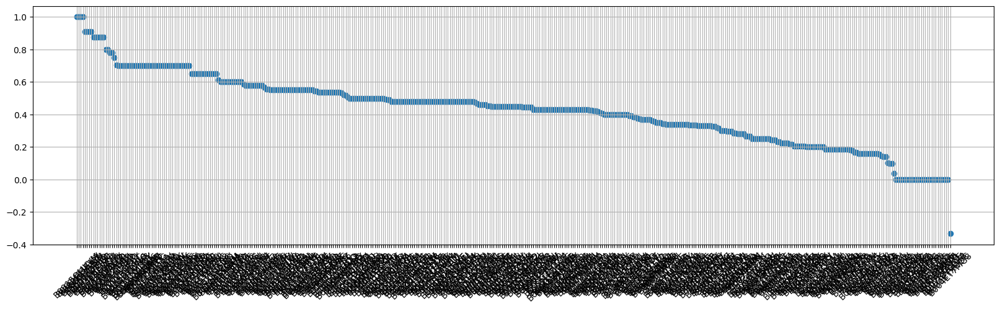

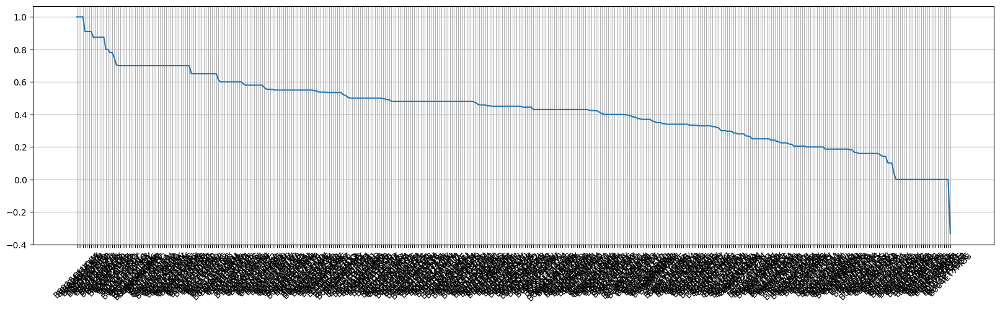

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
df_p_NoDup=df_p.drop_duplicates(subset="ProductId")
plt.figure(figsize=[20,5])
plt.grid()
plt.title(f"{uid} -(Scatter Plot) Customer specific Sentiment score for each product")
plt.xlabel("Sentiment score")
plt.ylabel("Product IDs")
plt.scatter(df_p_NoDup["ProductId"].iloc[:],df_p_NoDup["sentiment_score"].iloc[:])
plt.xticks(rotation=45)
plt.show()
plt.figure(figsize=[20,5])
plt.grid()
plt.title(f"{uid} -(Line Plot) Customer specific Sentiment score for each product")
plt.xlabel("Sentiment score")
plt.ylabel("Product IDs")
plt.plot(df_p_NoDup["ProductId"].iloc[:],df_p_NoDup["sentiment_score"].iloc[:])
plt.xticks(rotation=45)
plt.show()

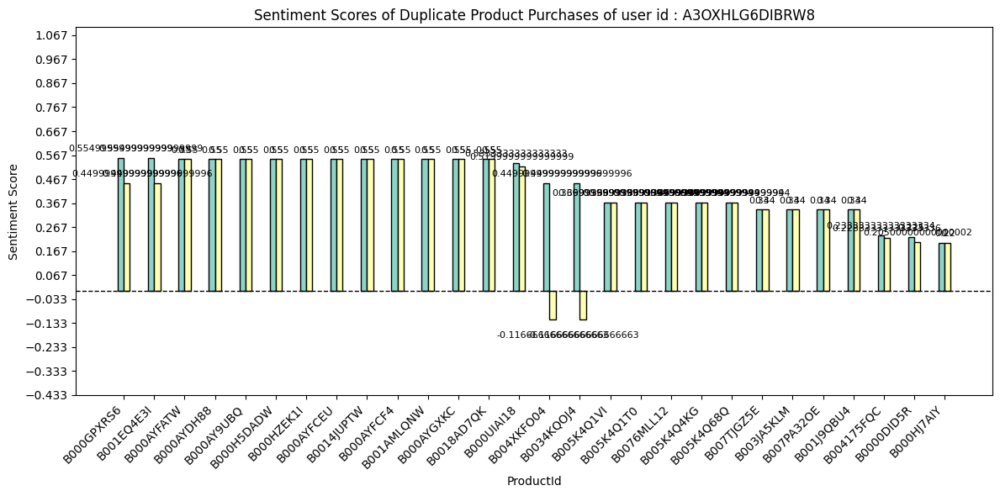

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Filter duplicate purchases
dup_products = df_p["ProductId"].value_counts()
dup_products = dup_products[dup_products > 1].index
df_dup = df_p[df_p["ProductId"].isin(dup_products)].copy()

# Step 2: Create a review index per product
df_dup["ReviewIndex"] = df_dup.groupby("ProductId").cumcount()

# Step 3: Plot setup
plt.figure(figsize=(12, 6))
product_ids = df_dup["ProductId"].unique()
x_locs = np.arange(len(product_ids))
bar_width = 0.2
colors = plt.cm.Set3.colors  # Use Set3 for varied pastel colors

# Step 4: Plot each review as a separate bar with borders
for i, pid in enumerate(product_ids):
    product_reviews = df_dup[df_dup["ProductId"] == pid]
    for idx, row in product_reviews.iterrows():
        offset = row["ReviewIndex"] * bar_width
        bar_color = colors[row["ReviewIndex"] % len(colors)]
        plt.bar(i + offset,
                row["sentiment_score"],
                width=bar_width,
                color=bar_color,
                edgecolor='black',         # <- Add border (black)
                linewidth=1.0)             # <- Border thickness

        # Annotate with full sentiment score
        y_pos = row["sentiment_score"]
        plt.text(i + offset,
                 y_pos + 0.02 if y_pos >= 0 else y_pos - 0.05,
                 f'{y_pos}',
                 ha='center',
                 va='bottom' if y_pos >= 0 else 'top',
                 fontsize=8)

# Step 5: Final touches
plt.axhline(0, color='black', linewidth=1.0, linestyle='--')  # Add vertical line at x=0
plt.ylim(min(df_p["sentiment_score"])-0.1, max(df_p["sentiment_score"]) + 0.1)
plt.yticks(np.arange(min(df_p["sentiment_score"])-0.1, max(df_p["sentiment_score"]) + 0.1, 0.1))  # Optional: set custom tick marks every 0.1
plt.xticks(ticks=x_locs + bar_width / 2, labels=product_ids, rotation=45, ha='right')
plt.title(f"Sentiment Scores of Duplicate Product Purchases of user id : {uid}")
plt.xlabel("ProductId")
plt.ylabel("Sentiment Score")
plt.tight_layout()
plt.show()


448 products reviewed by customer having ID A3OXHLG6DIBRW8:

Products purchased more than once:
Product ID: B005K4Q1VI purchased 2 times
Product ID: B007TJGZ5E purchased 2 times
Product ID: B000UIAI18 purchased 2 times
Product ID: B0018AD7QK purchased 2 times
Product ID: B004XKFO04 purchased 2 times
Product ID: B001AMLQNW purchased 2 times
Product ID: B000AYGXKC purchased 2 times
Product ID: B005K4Q68Q purchased 2 times
Product ID: B001EQ4E3I purchased 2 times
Product ID: B0000DID5R purchased 2 times
Product ID: B003JA5KLM purchased 2 times
Product ID: B0034KQOJ4 purchased 2 times
Product ID: B000AYFATW purchased 2 times
Product ID: B001J9QBU4 purchased 2 times
Product ID: B000AYFCEU purchased 2 times
Product ID: B007PA32OE purchased 2 times
Product ID: B000GPXRS6 purchased 2 times
Product ID: B005K4Q4KG purchased 2 times
Product ID: B000AYFCF4 purchased 2 times
Product ID: B0014JUPTW purchased 2 times
Product ID: B000HZEK1I purchased 2 times
Product ID: B000HJ7AIY purchased 2 times
Pr

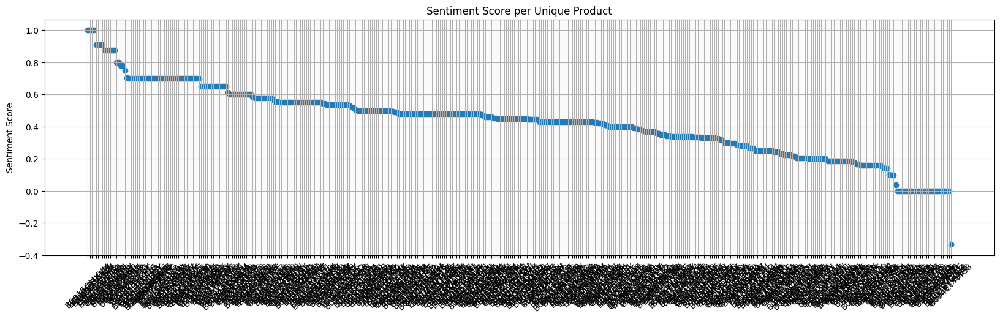

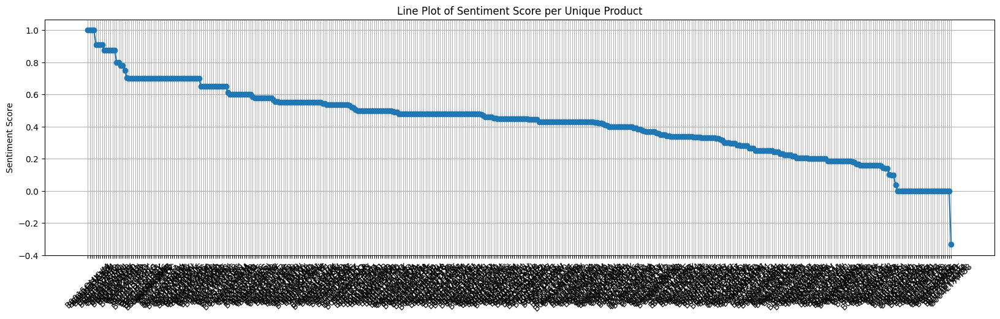

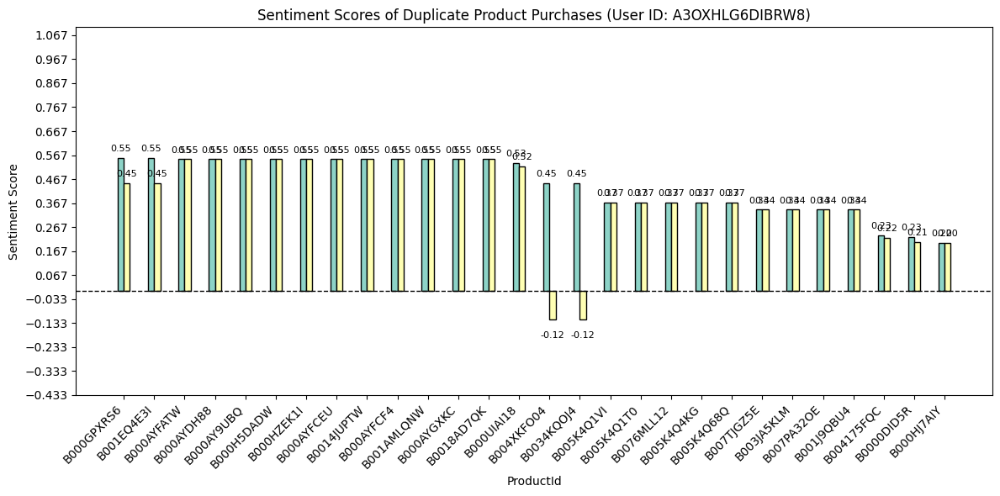


Total users who reviewed more than one product: 80589
                   UserId  UniqueProductsReviewed
0      #oc-R115TNMSPFT9I7                       2
1      #oc-R11D9D7SHXIJB9                       3
2      #oc-R11DNU2NBKQ23Z                       2
3      #oc-R11O5J5ZVQE25C                       3
4      #oc-R12KPBODL2B5ZD                       2
...                   ...                     ...
80584       AZZNK89PXD006                       6
80585       AZZTH6DJ0KSIP                       3
80586       AZZU1VEO8KUXH                       3
80587       AZZU4D6TZ2L6J                       2
80588       AZZV9PDNMCOZW                       3

[80589 rows x 2 columns]


In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from collections import Counter
from textblob import TextBlob

# Load your dataset first (replace 'your_dataset.csv' with the correct filename)
# Example:
# data = pd.read_csv("Reviews.csv")

# Set the user ID
#uid = "A1Z54EM24Y40LL"  # Replace with desired user ID

# Filter reviews by specific user
df_p = data.loc[data["UserId"] == uid,
                ["ProductId", "HelpfulnessNumerator", "HelpfulnessDenominator",
                 "Score", "Summary", "Text"]].reset_index(drop=True)

print(f"{len(df_p)} products reviewed by customer having ID {uid}:\n")

# Products purchased more than once
product_counts = Counter(df_p["ProductId"])
repeated_products = {pid: count for pid, count in product_counts.items() if count > 1}
if repeated_products:
    print("Products purchased more than once:")
    for pid, count in repeated_products.items():
        print(f"Product ID: {pid} purchased {count} times")
else:
    print("No products were purchased more than once.")

# Sentiment analysis using TextBlob
sentiment_scores = [TextBlob(summary).sentiment.polarity if isinstance(summary, str) else 0
                    for summary in df_p["Summary"]]
df_p["sentiment_score"] = sentiment_scores

# Sort and save
df_p.sort_values(by="sentiment_score", ascending=False, inplace=True, ignore_index=True)
df_p.to_csv("review.csv", index=False)

print("Sentiment score range:")
print("Min:", min(df_p["sentiment_score"]))
print("Max:", max(df_p["sentiment_score"]))

# --- Visualization 1: Scatter & Line plot of unique products ---
df_p_NoDup = df_p.drop_duplicates(subset="ProductId")

plt.figure(figsize=[20, 5])
plt.grid()
plt.scatter(df_p_NoDup["ProductId"], df_p_NoDup["sentiment_score"])
plt.xticks(rotation=45)
plt.title("Sentiment Score per Unique Product")
plt.ylabel("Sentiment Score")
plt.show()

plt.figure(figsize=[20, 5])
plt.grid()
plt.plot(df_p_NoDup["ProductId"], df_p_NoDup["sentiment_score"], marker='o')
plt.xticks(rotation=45)
plt.title("Line Plot of Sentiment Score per Unique Product")
plt.ylabel("Sentiment Score")
plt.show()

# --- Visualization 2: Bar plot for duplicate product reviews ---
dup_products = df_p["ProductId"].value_counts()
dup_products = dup_products[dup_products > 1].index
df_dup = df_p[df_p["ProductId"].isin(dup_products)].copy()

if not df_dup.empty:
    df_dup["ReviewIndex"] = df_dup.groupby("ProductId").cumcount()
    plt.figure(figsize=(12, 6))
    product_ids = df_dup["ProductId"].unique()
    x_locs = np.arange(len(product_ids))
    bar_width = 0.2
    colors = plt.cm.Set3.colors

    for i, pid in enumerate(product_ids):
        product_reviews = df_dup[df_dup["ProductId"] == pid]
        for idx, row in product_reviews.iterrows():
            offset = row["ReviewIndex"] * bar_width
            bar_color = colors[row["ReviewIndex"] % len(colors)]
            plt.bar(i + offset,
                    row["sentiment_score"],
                    width=bar_width,
                    color=bar_color,
                    edgecolor='black',
                    linewidth=1.0)

            y_pos = row["sentiment_score"]
            plt.text(i + offset,
                     y_pos + 0.02 if y_pos >= 0 else y_pos - 0.05,
                     f'{y_pos:.2f}',
                     ha='center',
                     va='bottom' if y_pos >= 0 else 'top',
                     fontsize=8)

    plt.axhline(0, color='black', linewidth=1.0, linestyle='--')
    plt.ylim(min(df_p["sentiment_score"]) - 0.1, max(df_p["sentiment_score"]) + 0.1)
    plt.yticks(np.arange(min(df_p["sentiment_score"]) - 0.1,
                         max(df_p["sentiment_score"]) + 0.1, 0.1))
    plt.xticks(ticks=x_locs + bar_width / 2, labels=product_ids, rotation=45, ha='right')
    plt.title(f"Sentiment Scores of Duplicate Product Purchases (User ID: {uid})")
    plt.xlabel("ProductId")
    plt.ylabel("Sentiment Score")
    plt.tight_layout()
    plt.show()
else:
    print("No duplicate product purchases found for sentiment bar chart.")

# --- NEW SECTION: List all users who reviewed more than one product ---
user_product_counts = data.groupby("UserId")["ProductId"].nunique()
users_with_multiple_products = user_product_counts[user_product_counts > 1].reset_index()
users_with_multiple_products.columns = ["UserId", "UniqueProductsReviewed"]

# Print summary
print(f"\nTotal users who reviewed more than one product: {len(users_with_multiple_products)}")
print(users_with_multiple_products)

# Save to CSV
users_with_multiple_products.to_csv("users_with_multiple_products.csv", index=False)


# Product specific